In [516]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns;

# Загрузка данных

In [517]:
df = pd.read_csv("cars_moldova.csv")
df

,Make,Model,Year,Style,Distance,Engine_capacity(cm3),Fuel_type,Transmission,Price(euro)
0,Toyota,Prius,2011,Hatchback,195000.0,1800.0,Hybrid,Automatic,7750.0
1,Renault,Grand Scenic,2014,Universal,135000.0,1500.0,Diesel,Manual,8550.0
2,Volkswagen,Golf,1998,Hatchback,1.0,1400.0,Petrol,Manual,2200.0
3,Renault,Laguna,2012,Universal,110000.0,1500.0,Diesel,Manual,6550.0
4,Opel,Astra,2006,Universal,200000.0,1600.0,Metan/Propan,Manual,4100.0
...,...,...,...,...,...,...,...,...,...
41002,Dacia,Logan Mcv,2015,Universal,89000.0,1500.0,Diesel,Manual,7000.0
41003,Renault,Modus,2009,Hatchback,225.0,1500.0,Diesel,Manual,4500.0
41004,Mercedes,E Class,2016,Sedan,50000.0,1950.0,Diesel,Automatic,29500.0
41005,Mazda,6,2006,Combi,370000.0,2000.0,Diesel,Manual,4000.0


# Анализ данных для выполнения заданий

## Информация о DF 

In [518]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41007 entries, 0 to 41006
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Make                  41007 non-null  object 
 1   Model                 41007 non-null  object 
 2   Year                  41007 non-null  int64  
 3   Style                 41007 non-null  object 
 4   Distance              41007 non-null  float64
 5   Engine_capacity(cm3)  41007 non-null  float64
 6   Fuel_type             41007 non-null  object 
 7   Transmission          41007 non-null  object 
 8   Price(euro)           41007 non-null  float64
dtypes: float64(3), int64(1), object(5)
memory usage: 2.8+ MB


## Поиск и удаление дубликатов

In [519]:
# Выводим количество дубликато
print(df.duplicated().sum())
# удаление дубликатов
df = df.drop_duplicates()
# Переназначаем индексы строк, удаляем старные индексы
df = df.reset_index(drop=True)
df

3743


,Make,Model,Year,Style,Distance,Engine_capacity(cm3),Fuel_type,Transmission,Price(euro)
0,Toyota,Prius,2011,Hatchback,195000.0,1800.0,Hybrid,Automatic,7750.0
1,Renault,Grand Scenic,2014,Universal,135000.0,1500.0,Diesel,Manual,8550.0
2,Volkswagen,Golf,1998,Hatchback,1.0,1400.0,Petrol,Manual,2200.0
3,Renault,Laguna,2012,Universal,110000.0,1500.0,Diesel,Manual,6550.0
4,Opel,Astra,2006,Universal,200000.0,1600.0,Metan/Propan,Manual,4100.0
...,...,...,...,...,...,...,...,...,...
37259,Land Rover,Freelander,2002,Crossover,225000.0,1800.0,Metan/Propan,Manual,4400.0
37260,Dacia,Logan Mcv,2015,Universal,89000.0,1500.0,Diesel,Manual,7000.0
37261,Renault,Modus,2009,Hatchback,225.0,1500.0,Diesel,Manual,4500.0
37262,Mazda,6,2006,Combi,370000.0,2000.0,Diesel,Manual,4000.0


In [520]:
# проверяем наличие дубликатов
print(df.duplicated().sum())

0


## Исследование численных признаков

In [521]:
df.describe()

,Year,Distance,Engine_capacity(cm3),Price(euro)
count,37264.000000,3.726400e+04,37264.000000,3.726400e+04
mean,2007.709264,4.758488e+05,1858.932535,9.569387e+03
std,8.295806,4.591520e+06,707.662731,5.283315e+04
min,1900.000000,0.000000e+00,0.000000,1.000000e+00
25%,2004.000000,9.000000e+04,1499.000000,3.300000e+03
50%,2009.000000,1.700000e+05,1800.000000,6.490000e+03
75%,2014.000000,2.300000e+05,2000.000000,1.179900e+04
max,2021.000000,1.000000e+08,9999.000000,1.000000e+07


Разделение на типы столбцов а именно на численные и объекты.

In [522]:
cat_columns = []
num_columns = []

for column_name in df.columns:
    if (df[column_name].dtypes == object):
        cat_columns +=[column_name]
    else:
        num_columns +=[column_name]

Гистограммы распределений по каждому числовому признаку.

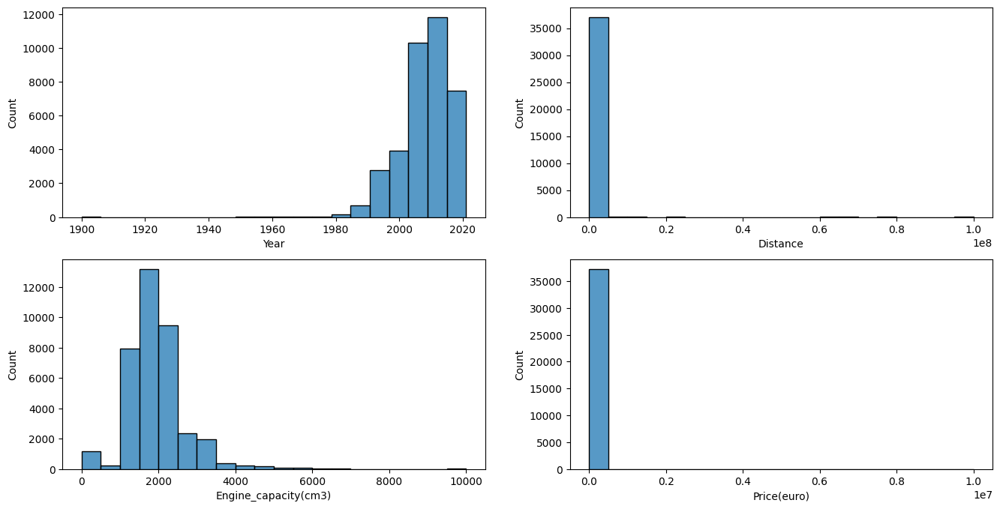

In [523]:
plt.subplots(2, 2, figsize=(16,8))

for idx, column_name in enumerate(num_columns):
    plt.subplot(2, 2, idx+1)
    sns.histplot(df, x=column_name, bins = 20)

Все диаграммы говороят о наличии аномали. Для того чтобы лучше понять аномалии выведем эти же графики, но в логарифмическом масштабе.

Year
Distance
Engine_capacity(cm3)
Price(euro)


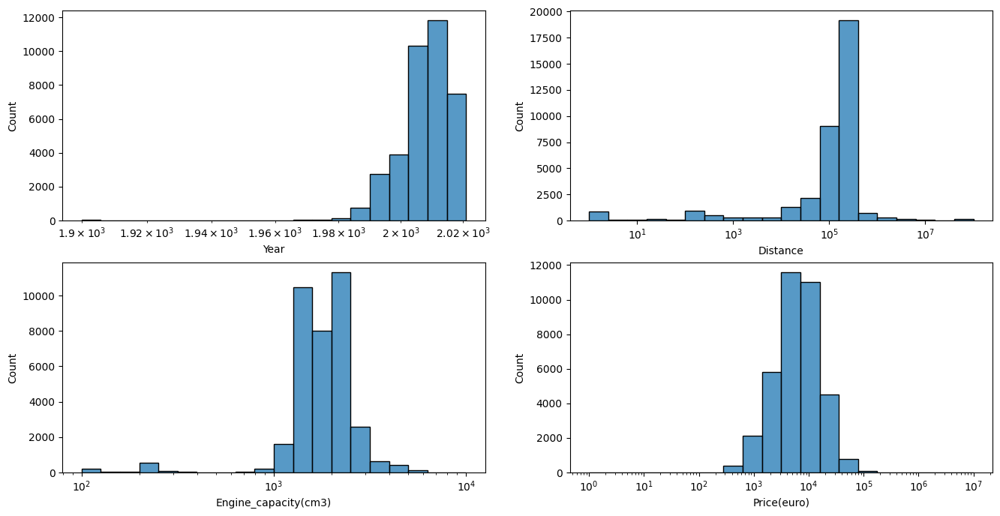

In [524]:
plt.subplots(2, 2, figsize=(16,8))

for idx, column_name in enumerate(num_columns):

    # Удаляем все 0 значения
    zero_count= df[df[''+column_name] == 0]
    df = df.drop(zero_count.index)

    #Делаем переиндексацию
    df = df.reset_index(drop=True)

    print(column_name)
    plt.subplot(2, 2, idx+1)
    sns.histplot(df, x=column_name, bins = 20, log_scale=True)


## Удалеление аномалий

Сделаем предваритильную чистку

In [525]:
# Удаляем данные которые не привышают 21 год и дистанцию 1100
question_dist = df[(df.Year <2021) & (df.Distance < 1100)]
df = df.drop(question_dist.index)

# Удаляем аномальные значения пройденных км 
question_dist = df[(df.Distance > 0.8e6)]
df = df.drop(question_dist.index)

question_dist = df[(df.Distance < 10)]
df = df.drop(question_dist.index)

# Удаляем слишком строки со слишком маленьким объемом двигателя
question_engine = df[df["Engine_capacity(cm3)"] < 650]
df = df.drop(question_engine.index)

# Удаляем слишком строки со слишком большим объемом двигателя
question_engine = df[df["Engine_capacity(cm3)"] > 6000]
df = df.drop(question_engine.index)

# Убераем строки с анамально ценой опираясь на гистограмму
question_price = df[(df["Price(euro)"] < 101)]
df = df.drop(question_price.index)
question_price = df[df["Price(euro)"] > 0.8e5]
df = df.drop(question_price.index)

# Убераем строки с анамальным годом опираясь на гистограмму
question_year = df[df.Year < 1975]
df = df.drop(question_year.index)

#Проводим переиндексацию
df = df.reset_index(drop=True)

Посмотрим получившийся результат

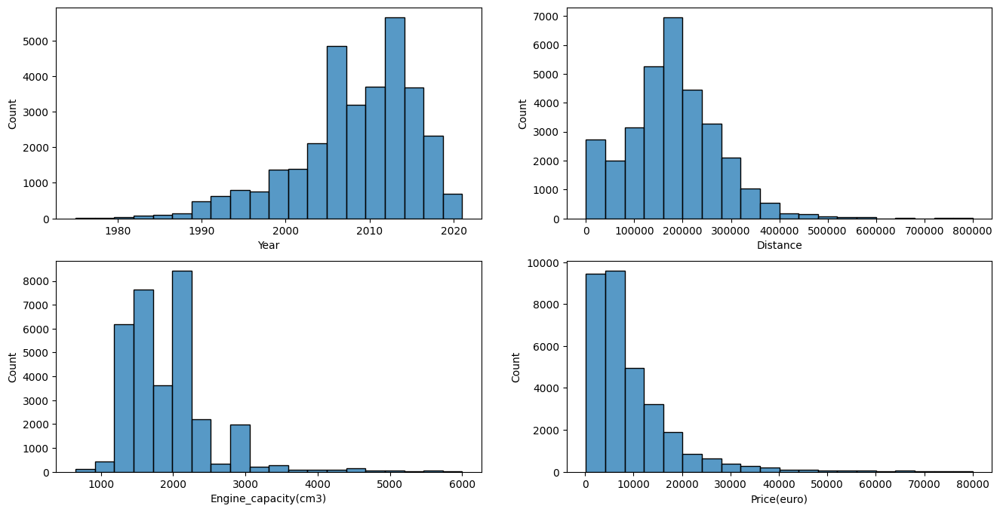

In [526]:
plt.subplots(2, 2, figsize=(16,8))

for idx, column_name in enumerate(num_columns):
    plt.subplot(2, 2, idx+1)
    sns.histplot(df, x=column_name, bins = 20)

Посмотрим на данные в виде boxplot

Year
Distance
Engine_capacity(cm3)
Price(euro)


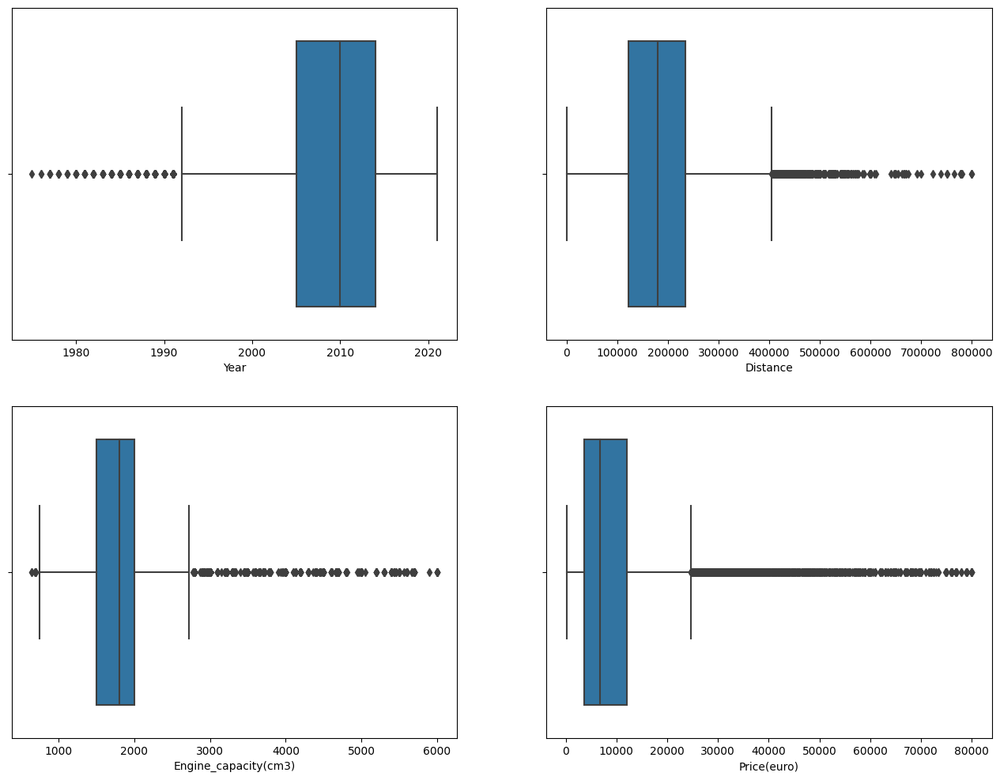

In [527]:
plt.subplots(2, 2, figsize=(16, 12))
for idx, column_name in enumerate(num_columns):

    print(column_name)
    plt.subplot(2, 2, idx+1)
    sns.boxplot(df, x=column_name)

Из графиков видно, что аномалии еще присуствуют, но теперь их не так много. Уберем оставшиеся

In [528]:
# Удаляем аномальные значения пройденных км 
question_dist = df[(df.Distance > 0.55e6)]
df = df.drop(question_dist.index)

# Удаляем слишком строки со слишком большим объемом двигателя
question_engine = df[df["Engine_capacity(cm3)"] > 5000]
df = df.drop(question_engine.index)

question_price = df[df["Price(euro)"] > 0.7e5]
df = df.drop(question_price.index)

# Убераем строки с анамальным годом опираясь на гистограмму
question_year = df[df.Year < 1990]
df = df.drop(question_year.index)

#Проводим переиндексацию
df = df.reset_index(drop=True)

Посмотрим получившийся результат

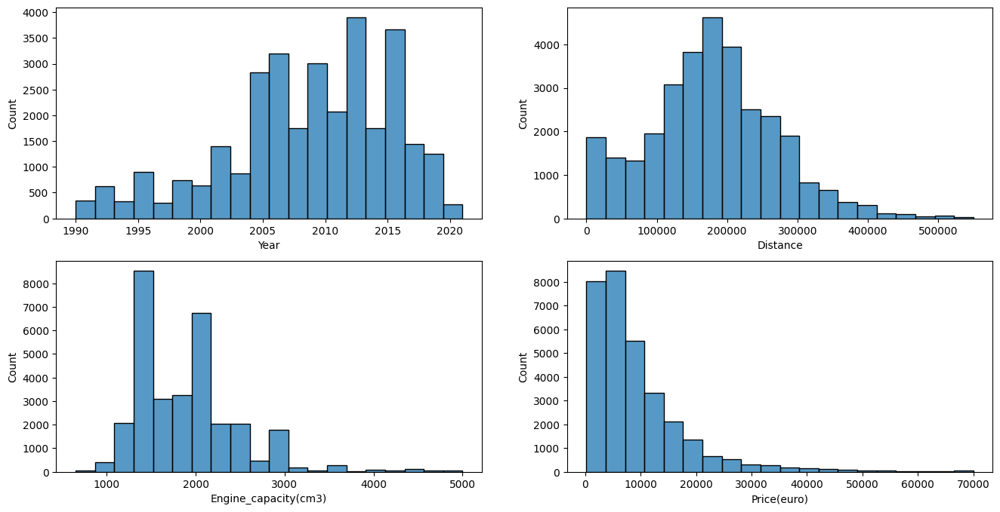

In [529]:
plt.subplots(2, 2, figsize=(16,8))

for idx, column_name in enumerate(num_columns):
    plt.subplot(2, 2, idx+1)
    sns.histplot(df, x=column_name, bins = 20)

In [530]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31303 entries, 0 to 31302
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Make                  31303 non-null  object 
 1   Model                 31303 non-null  object 
 2   Year                  31303 non-null  int64  
 3   Style                 31303 non-null  object 
 4   Distance              31303 non-null  float64
 5   Engine_capacity(cm3)  31303 non-null  float64
 6   Fuel_type             31303 non-null  object 
 7   Transmission          31303 non-null  object 
 8   Price(euro)           31303 non-null  float64
dtypes: float64(3), int64(1), object(5)
memory usage: 2.1+ MB


## Добавление данных 

Добавляем новый признак в данные а именно пробег за год

<AxesSubplot: xlabel='km_year', ylabel='Count'>

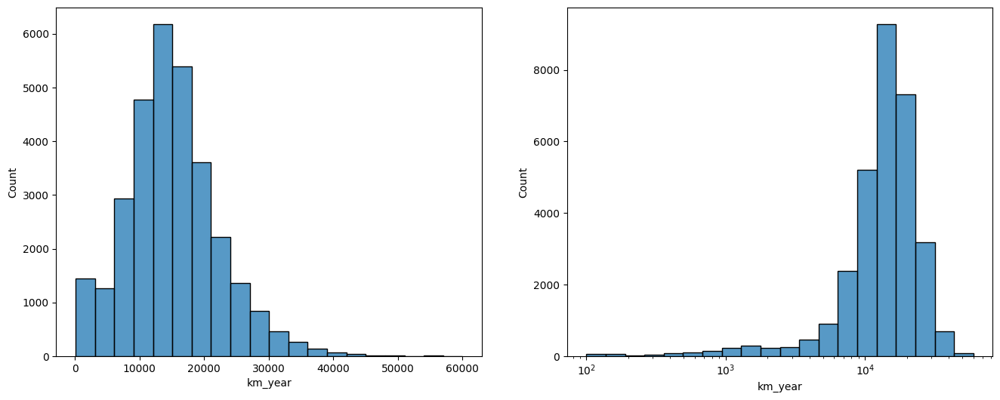

In [531]:
#Добавляем признак возрас
df['Age'] = 2022 - df.Year

#Добавляем признак километры в год
df['km_year'] = df.Distance/df.Age
question_km_year = df[df.km_year >  60e3]
df = df.drop(question_km_year.index)
question_km_year = df[df.km_year <  100]
df = df.drop(question_km_year.index)
df = df.reset_index(drop=True)

plt.subplots(1, 2, figsize=(16, 6))
plt.subplot(1, 2, 1)
sns.histplot(df, x='km_year', bins=20)
plt.subplot(1, 2, 2)
sns.histplot(data=df, x='km_year', bins = 20, log_scale=True)


Важно, чтобы новый признак был независим от других 

<AxesSubplot: xlabel='km_year', ylabel='Distance'>

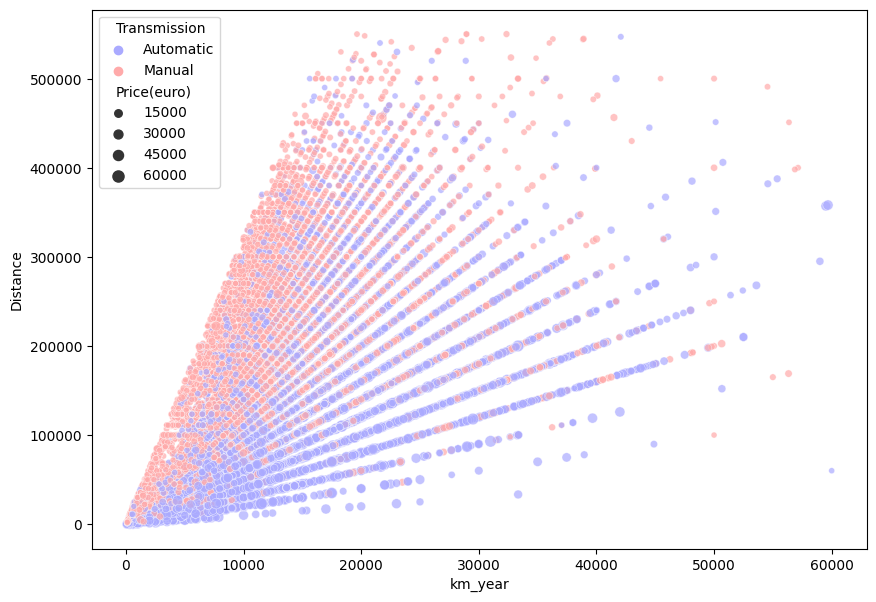

In [532]:
plt.figure(figsize=(10,7))
sns.scatterplot(data=df, 
    x="km_year", y="Distance", 
    hue="Transmission", 
    size = "Price(euro)", 
    alpha = 0.7, 
    palette='bwr')

<AxesSubplot: xlabel='km_year', ylabel='Year'>

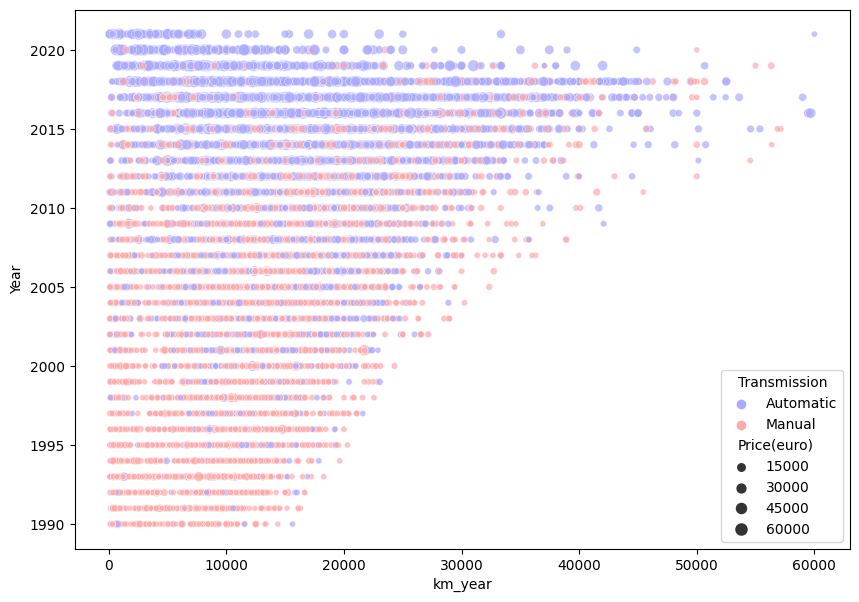

In [533]:
plt.figure(figsize=(10,7))
sns.scatterplot(data=df, 
    x="km_year", y="Year",
    hue="Transmission", 
    size = "Price(euro)", 
    alpha = 0.7,
    palette='bwr'
    )

Добавим в список численных данных возраст машин и пройденные километры за год

In [534]:
num_columns.append('km_year')
num_columns.append('Age')
num_columns

['Year', 'Distance', 'Engine_capacity(cm3)', 'Price(euro)', 'km_year', 'Age']

Посмотрим на корреляцию численных столбцов

In [535]:
cm = sns.color_palette("vlag", as_cmap=True)
df.corr().style.background_gradient(cmap=cm, vmin = -1, vmax=1) 

C:\Users\xxlen\AppData\Local\Temp\ipykernel_18996\577554102.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr().style.background_gradient(cmap=cm, vmin = -1, vmax=1)


,Year,Distance,Engine_capacity(cm3),Price(euro),Age,km_year
Year,1.000000,-0.487772,-0.081940,0.592220,-1.000000,0.414466
Distance,-0.487772,1.000000,0.103082,-0.370500,0.487772,0.447088
Engine_capacity(cm3),-0.081940,0.103082,1.000000,0.394567,0.081940,-0.024068
Price(euro),0.592220,-0.370500,0.394567,1.000000,-0.592220,0.180018
Age,-1.000000,0.487772,0.081940,-0.592220,1.000000,-0.414466
km_year,0.414466,0.447088,-0.024068,0.180018,-0.414466,1.000000


## Зависимости параметров друг от друга

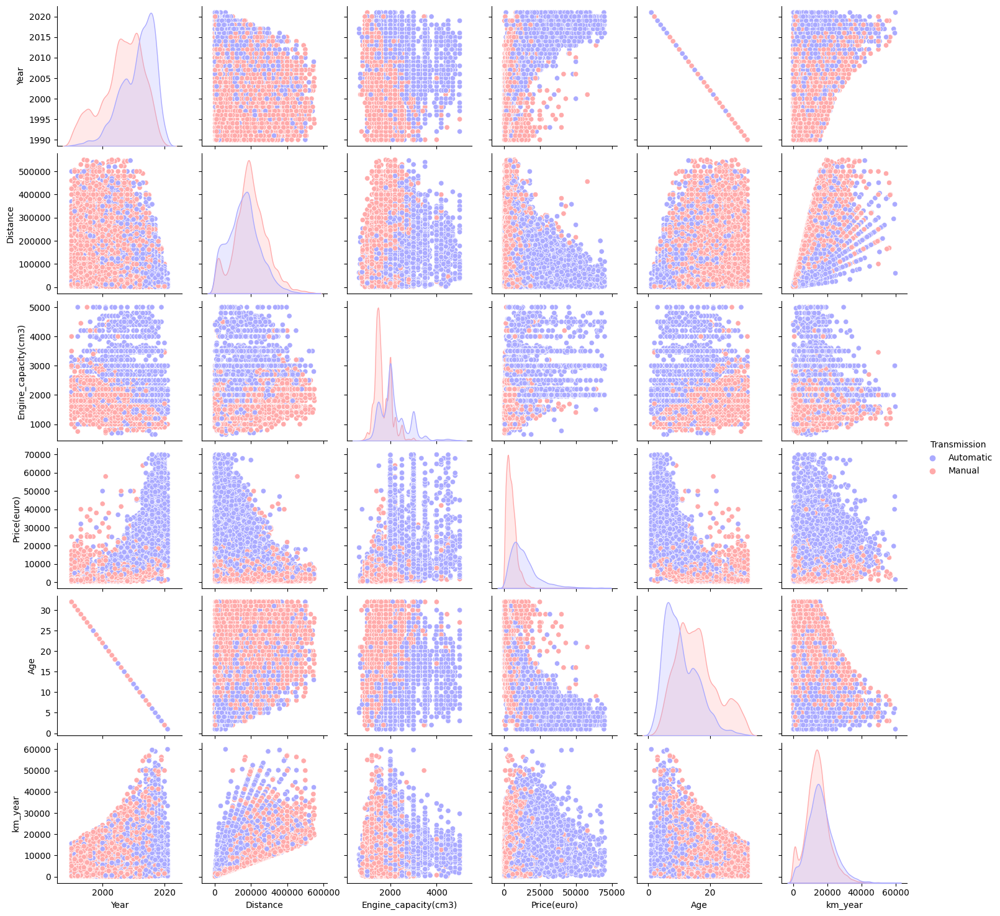

In [536]:
sns.pairplot(df, hue ='Transmission', palette = 'bwr')

## Категориальные данные
посмотрим на число повторений результата в каждом категориальном признак

In [537]:
df[cat_columns].nunique()

Make             78
Model           751
Style            12
Fuel_type         6
Transmission      2
dtype: int64

Оказалось, что часть из наших признаков имеют слишком много записей. Вероятно, редкие из них можно исключить без потери точности. Мы сделаем эту операцию объявив такие записи одним типом - rare.

In [538]:
counts = df.Make.value_counts()
counts

Volkswagen    3287
Toyota        3039
Mercedes      2851
BMW           2440
Renault       2331
              ... 
Changan          1
Tata             1
Saturn           1
Tesla            1
Pontiac          1
Name: Make, Length: 78, dtype: int64

In [539]:
print(counts.median())
counts[counts<100]

32.0


Rover               84
Chrysler            80
Jeep                75
Mini                71
Infiniti            66
Jaguar              62
Daewoo              60
Dodge               49
Lincoln             45
Alfa Romeo          38
Ssangyong           32
Smart               32
Daihatsu            25
Chery               18
GAZ                 16
Cadillac            16
Lancia              16
Great Wall          15
Byd                 14
Acura               14
Alta marca          13
Saab                13
Brilliance          11
Moskvich / Izh      10
Lifan               10
UAZ                  8
Lada                 6
GMC                  5
Ravon                5
Buick                5
Zaz                  4
Isuzu                4
Maserati             3
LuAZ                 3
Geely                3
Haima                3
Scion                3
Datsun               3
Faw                  2
Hummer               2
Mercedes-Maybach     2
ARO                  2
Abarth               1
Groz       

Добавим категориб редких производителей авто

In [540]:
rare =  counts[(counts.values < 25)]
df['Make'] = df['Make'].replace(rare.index.values, 'Rare')
df.Make.value_counts()

Volkswagen    3287
Toyota        3039
Mercedes      2851
BMW           2440
Renault       2331
Opel          1764
Skoda         1718
Audi          1448
Dacia         1341
Ford          1303
Nissan        1228
Hyundai       1199
Honda          875
KIA            649
Mitsubishi     595
Lexus          576
Volvo          560
Mazda          417
Peugeot        383
Vaz            347
Chevrolet      321
Citroen        288
Land Rover     266
Seat           239
Rare           237
Fiat           181
Porsche        172
Suzuki         151
Subaru         148
Rover           84
Chrysler        80
Jeep            75
Mini            71
Infiniti        66
Jaguar          62
Daewoo          60
Dodge           49
Lincoln         45
Alfa Romeo      38
Smart           32
Ssangyong       32
Daihatsu        25
Name: Make, dtype: int64

In [541]:
counts = df.Model.value_counts()
counts

E Class     1054
5 Series     965
Passat       820
Megane       800
Astra        788
            ... 
G Series       1
F-Type         1
90             1
X7             1
Siber          1
Name: Model, Length: 751, dtype: int64

In [542]:
print(counts.median())
counts[counts<100]

9.0


Primera     98
Clio        97
X-Trail     91
Juke        88
Combo       88
            ..
G Series     1
F-Type       1
90           1
X7           1
Siber        1
Name: Model, Length: 680, dtype: int64

Добавим категориб редких моделей авто

In [543]:
counts = df.Model.value_counts()
rare =  counts[(counts.values <  50)]
df['Model'] = df['Model'].replace(rare.index.values, 'Rare')
df.Model.value_counts()

Rare             6632
E Class          1054
5 Series          965
Passat            820
Megane            800
                 ... 
GLC                52
GLE                52
Accent             51
Urban Cruiser      51
Matrix             50
Name: Model, Length: 128, dtype: int64

# Сохранение DataFrame в файл


In [544]:
df.to_csv('cars_moldova_clean.csv',index=False)

# Задание 1 

Рисуем графики

<AxesSubplot: xlabel='Year', ylabel='Price(euro)'>

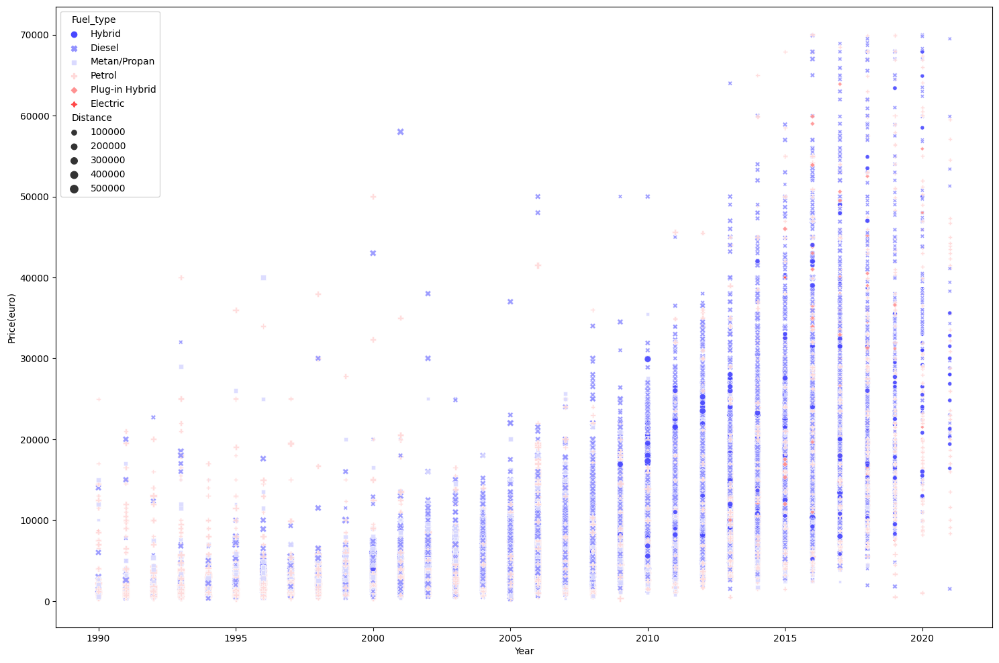

In [545]:
plt.figure(figsize=(18,12))
sns.scatterplot(
    df,
    x="Year", 
    y="Price(euro)",
    hue="Fuel_type", 
    size = "Distance", 
    alpha = 0.9,
    palette='bwr', 
    style ="Fuel_type"
    )

<AxesSubplot: xlabel='Distance', ylabel='Count'>

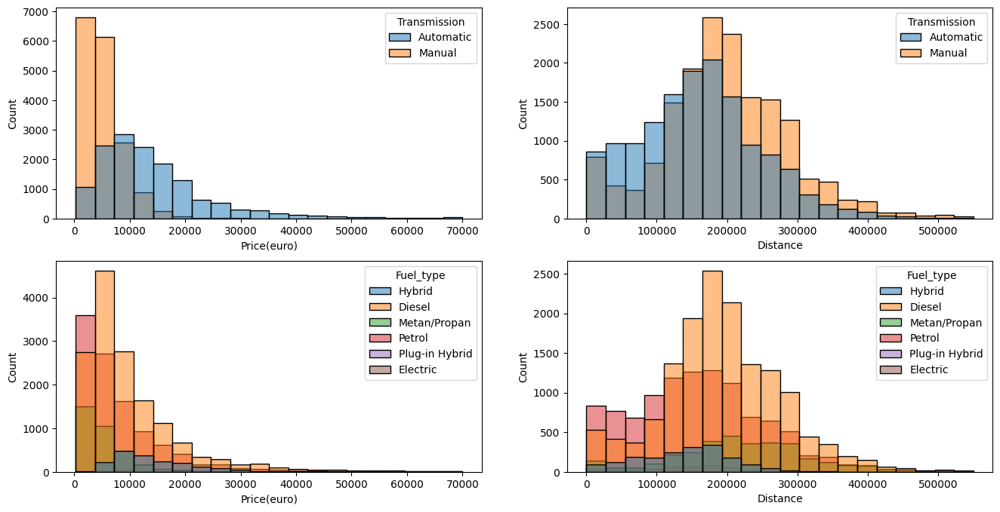

In [546]:
plt.subplots(2, 2, figsize=(16,8))
plt.subplot(2, 2, 1)
sns.histplot(df, x='Price(euro)',bins=20, hue='Transmission')
plt.subplot(2, 2, 2)
sns.histplot(df, x='Distance',bins=20, hue='Transmission')
plt.subplot(2, 2, 3)
sns.histplot(df, x='Price(euro)',bins=20, hue='Fuel_type')
plt.subplot(2, 2, 4)
sns.histplot(df, x='Distance',bins=20, hue='Fuel_type')

<AxesSubplot: xlabel='Distance', ylabel='Price(euro)'>

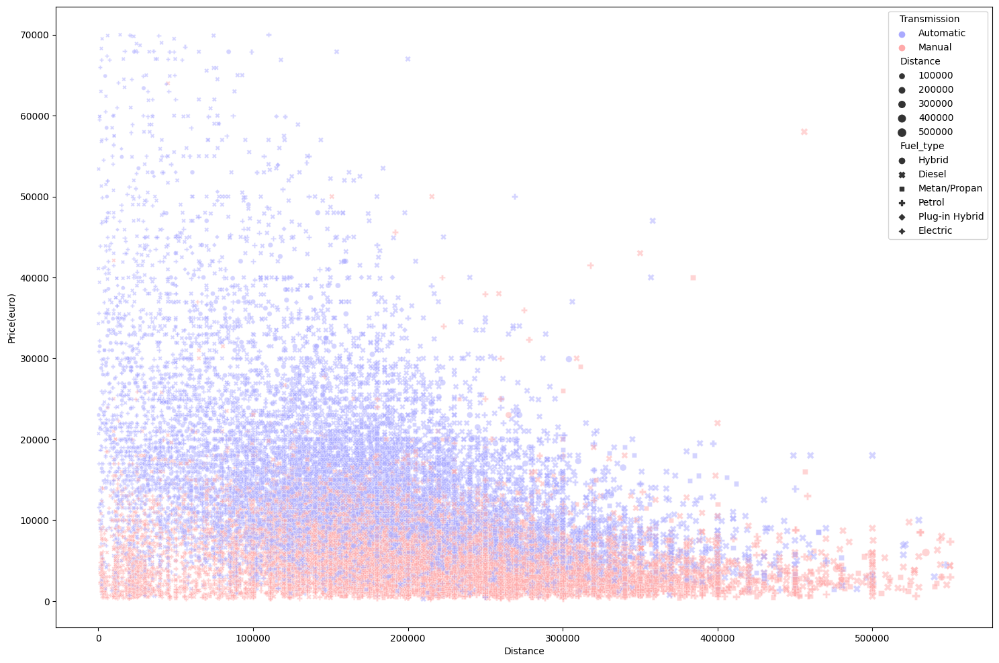

In [547]:
plt.figure(figsize=(18,12))
sns.scatterplot(df,
    x="Distance", 
    y="Price(euro)",
    hue="Transmission", 
    size = "Distance", 
    alpha = 0.5,
    palette='bwr', 
    style ="Fuel_type"
    )

# Задание 2

Выполню 1 пункт задания и введу категории пробега

In [548]:
labels = ['low_km_year', 'mean_km_year', 'high_km_year']
# Разделю пробег на 3 равные части, которые будут соотвествовать категориям
df['km_year_category'] = pd.qcut(df['km_year'], 3, labels)
print(df['km_year_category'].value_counts())
df


mean_km_year    10378
low_km_year     10366
high_km_year    10329
Name: km_year_category, dtype: int64


,Make,Model,Year,Style,Distance,Engine_capacity(cm3),Fuel_type,Transmission,Price(euro),Age,km_year,km_year_category
0,Toyota,Prius,2011,Hatchback,195000.0,1800.0,Hybrid,Automatic,7750.0,11,17727.272727,high_km_year
1,Renault,Grand Scenic,2014,Universal,135000.0,1500.0,Diesel,Manual,8550.0,8,16875.000000,mean_km_year
2,Renault,Laguna,2012,Universal,110000.0,1500.0,Diesel,Manual,6550.0,10,11000.000000,low_km_year
3,Opel,Astra,2006,Universal,200000.0,1600.0,Metan/Propan,Manual,4100.0,16,12500.000000,mean_km_year
4,Mercedes,Vito,2000,Microvan,300000.0,2200.0,Diesel,Manual,3490.0,22,13636.363636,mean_km_year
...,...,...,...,...,...,...,...,...,...,...,...,...
31068,Volkswagen,Passat,2016,Sedan,88000.0,1800.0,Petrol,Automatic,11500.0,6,14666.666667,mean_km_year
31069,Land Rover,Freelander,2002,Crossover,225000.0,1800.0,Metan/Propan,Manual,4400.0,20,11250.000000,low_km_year
31070,Dacia,Logan Mcv,2015,Universal,89000.0,1500.0,Diesel,Manual,7000.0,7,12714.285714,mean_km_year
31071,Mazda,6,2006,Combi,370000.0,2000.0,Diesel,Manual,4000.0,16,23125.000000,high_km_year


Выполню 2 пункт задания и разделю редкиз производителей на дешевых и дорогих

In [549]:
#Разделю на 2 категории дорогие и дешевые на границе 14000 евро
df.loc[(df['Price(euro)']<14000) & (df['Make']=='Rare'), 'Make'] = 'Rare_сheap'
df.loc[(df['Price(euro)'] >= 14000) & (df['Make']=='Rare'), 'Make'] = 'Rare_expensive'

#Выведу дешевые
df[df['Make']=='Rare_сheap']

,Make,Model,Year,Style,Distance,Engine_capacity(cm3),Fuel_type,Transmission,Price(euro),Age,km_year,km_year_category
18,Rare_сheap,Rare,1992,Sedan,68000.0,2445.0,Petrol,Manual,2222.0,30,2266.666667,low_km_year
224,Rare_сheap,Rare,2016,Sedan,150000.0,1596.0,Metan/Propan,Manual,3200.0,6,25000.000000,high_km_year
363,Rare_сheap,Rare,2007,Sedan,194777.0,2000.0,Petrol,Automatic,5000.0,15,12985.133333,mean_km_year
1097,Rare_сheap,Rare,2008,SUV,176000.0,2300.0,Metan/Propan,Automatic,9800.0,14,12571.428571,mean_km_year
1279,Rare_сheap,Rare,2017,Sedan,160233.0,1500.0,Metan/Propan,Manual,4200.0,5,32046.600000,high_km_year
...,...,...,...,...,...,...,...,...,...,...,...,...
30901,Rare_сheap,Rare,2008,Hatchback,85000.0,800.0,Metan/Propan,Manual,2100.0,14,6071.428571,low_km_year
30913,Rare_сheap,Rare,2008,SUV,18800.0,2400.0,Metan/Propan,Manual,5800.0,14,1342.857143,low_km_year
30979,Rare_сheap,Rare,2008,Universal,160000.0,800.0,Metan/Propan,Manual,650.0,14,11428.571429,low_km_year
30985,Rare_сheap,Rare,2005,Roadster,222111.0,2000.0,Petrol,Manual,3333.0,17,13065.352941,mean_km_year


In [550]:
#Выведу дорогие
df[df['Make']=='Rare_expensive']

,Make,Model,Year,Style,Distance,Engine_capacity(cm3),Fuel_type,Transmission,Price(euro),Age,km_year,km_year_category
434,Rare_expensive,Rare,2015,Sedan,88000.0,2000.0,Petrol,Automatic,16950.0,7,12571.428571,mean_km_year
781,Rare_expensive,Rare,1995,Hatchback,275000.0,2300.0,Petrol,Manual,36000.0,27,10185.185185,low_km_year
2003,Rare_expensive,Rare,2015,Sedan,74000.0,2000.0,Petrol,Automatic,16949.0,7,10571.428571,low_km_year
2259,Rare_expensive,Rare,2019,Crossover,2000.0,1995.0,Petrol,Automatic,29900.0,3,666.666667,low_km_year
2923,Rare_expensive,Rare,2018,SUV,41000.0,1500.0,Petrol,Automatic,16999.0,4,10250.000000,low_km_year
3620,Rare_expensive,Rare,2014,Pickup,135335.0,2500.0,Diesel,Manual,18200.0,8,16916.875000,mean_km_year
5213,Rare_expensive,Rare,2017,Sedan,38000.0,3000.0,Petrol,Automatic,45000.0,5,7600.000000,low_km_year
8888,Rare_expensive,Rare,2017,Sedan,91000.0,2000.0,Plug-in Hybrid,Automatic,30999.0,5,18200.000000,high_km_year
8889,Rare_expensive,Altele,2017,Sedan,87000.0,2000.0,Plug-in Hybrid,Automatic,29999.0,5,17400.000000,high_km_year
9027,Rare_expensive,Rare,2016,Sedan,18000.0,2000.0,Petrol,Automatic,15000.0,6,3000.000000,low_km_year


# Задание 3

### Нормализация

In [551]:
DF_norm  = df.copy()
Xmin = df[num_columns].min()
Xmax = df[num_columns].max()

DF_norm[num_columns] = (df[num_columns]- Xmin)/( Xmax - Xmin)

<AxesSubplot: xlabel='Distance', ylabel='Count'>

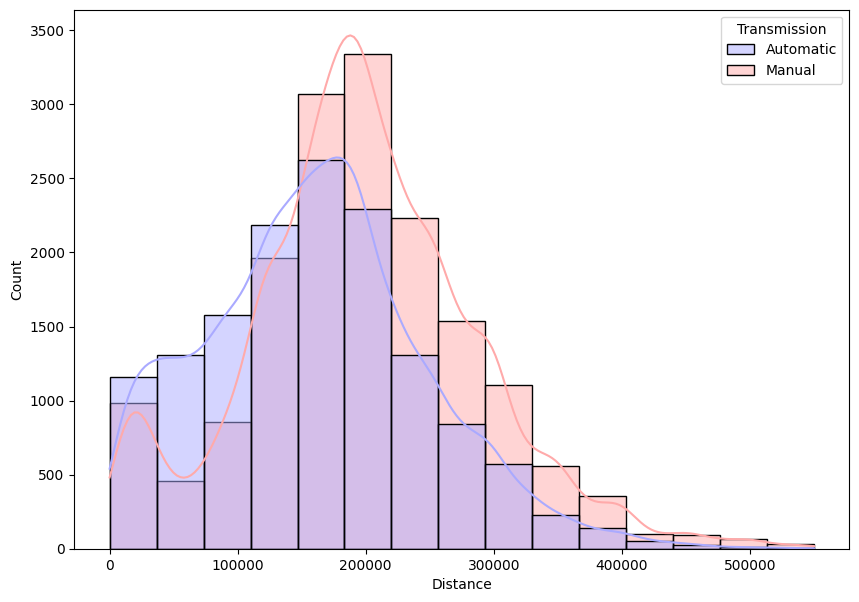

In [552]:
fig = plt.figure(figsize=(10,7))
sns.histplot(
         df,
         x = 'Distance',
         hue = 'Transmission',
         bins = 15, kde = True,
         palette='bwr')

### Стандартизация

In [553]:
DF_scaled = df.copy()
M = df[num_columns].mean()
STD = df[num_columns].std()
DF_scaled[num_columns] = (df[num_columns]-M)/STD

<AxesSubplot: xlabel='Distance', ylabel='Count'>

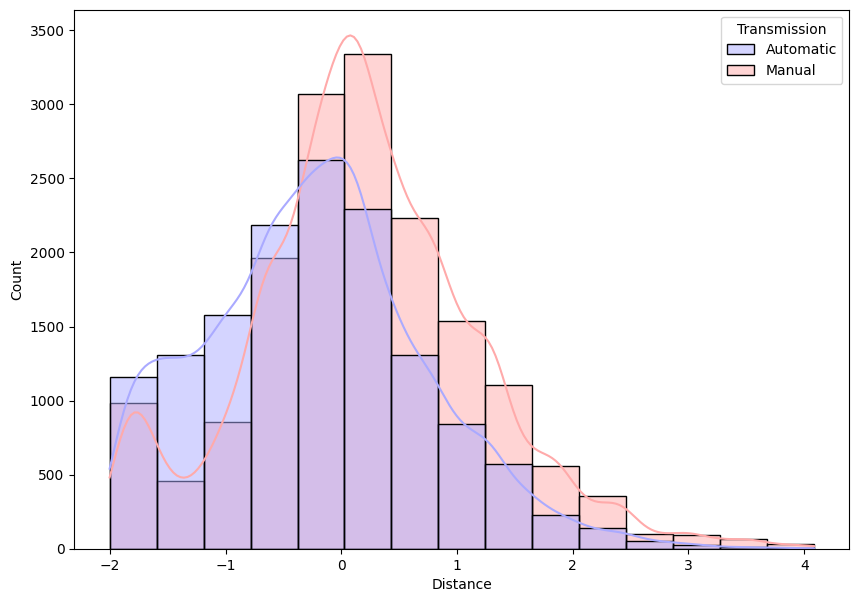

In [554]:
fig = plt.figure(figsize=(10,7))
sns.histplot(
            DF_scaled,
            x = 'Distance', 
            hue = 'Transmission',
            bins = 15, kde = True,
            palette='bwr')

### Нелинейное преобразование



Cначала логарифмирование, потом стандартизация

<AxesSubplot: xlabel='Price(euro)', ylabel='Count'>

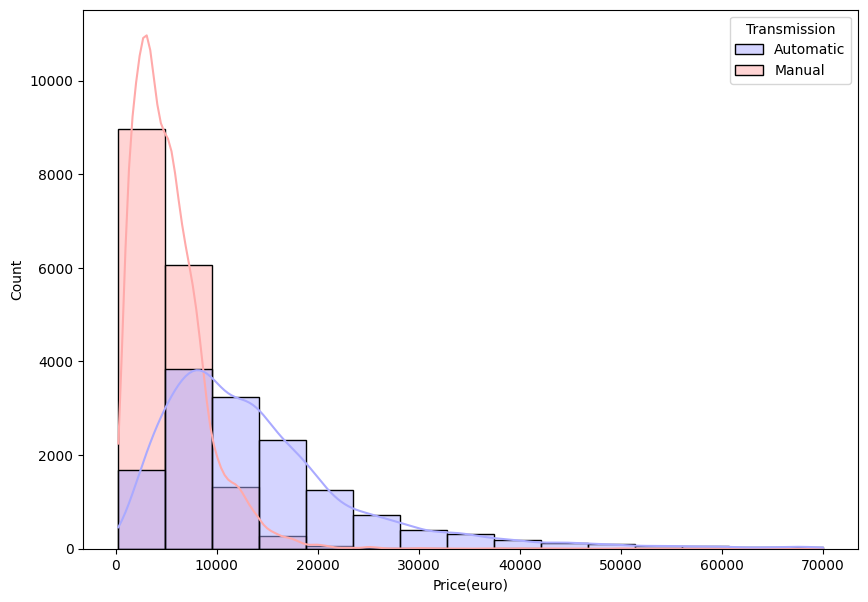

In [555]:
fig = plt.figure(figsize=(10,7))

sns.histplot(data = 
            df,
            x = 'Price(euro)', 
            hue = 'Transmission', 
            bins = 15, kde = True,
            palette='bwr')

In [556]:
DF_power  = df.copy()
DF_power[num_columns] = np.log(DF_power[num_columns])
M = DF_power[num_columns].mean()
STD = DF_power[num_columns].std()
DF_power[num_columns] = (DF_power[num_columns]-M)/STD

<AxesSubplot: xlabel='Price(euro)', ylabel='Count'>

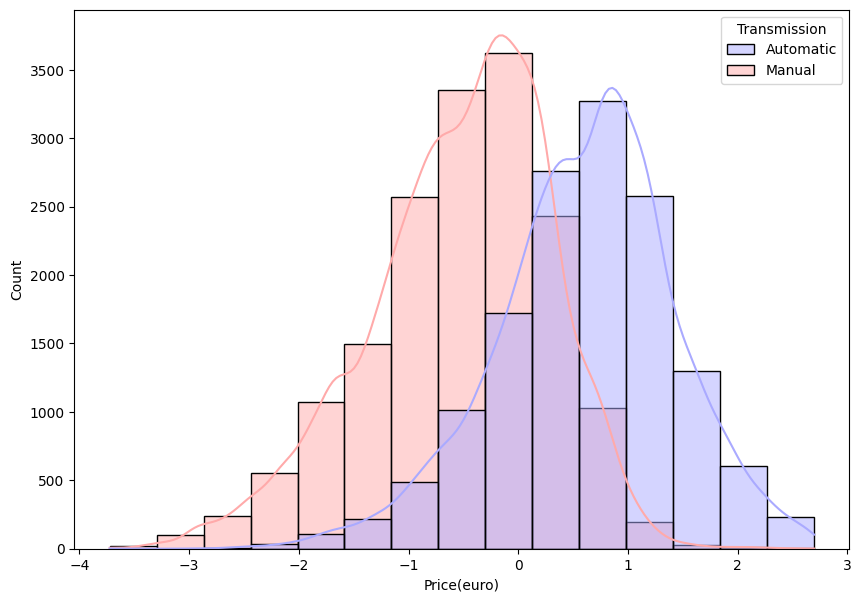

In [557]:
fig = plt.figure(figsize=(10,7))

sns.histplot(data = DF_power, 
             x = 'Price(euro)', 
             hue = 'Transmission', 
             bins = 15, kde = True,
             palette='bwr')

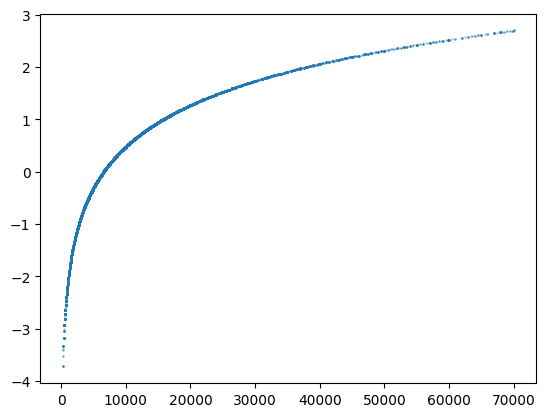

In [558]:
plt.plot(df['Price(euro)'], DF_power['Price(euro)'], '.', alpha = 0.5, markersize = 1)

### Бинарные признаки

In [559]:
df['Transmission'] = df['Transmission'].map({'Automatic': 1, 'Manual': 0})

### Кодирование многозначных признаков

In [560]:
df_se = df.copy()
df_se[cat_columns] = df_se[cat_columns].astype('category')

for _, column_name in enumerate(cat_columns):
    df_se[column_name] =  df_se[column_name].cat.codes
df_se.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31073 entries, 0 to 31072
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   Make                  31073 non-null  int8    
 1   Model                 31073 non-null  int16   
 2   Year                  31073 non-null  int64   
 3   Style                 31073 non-null  int8    
 4   Distance              31073 non-null  float64 
 5   Engine_capacity(cm3)  31073 non-null  float64 
 6   Fuel_type             31073 non-null  int8    
 7   Transmission          31073 non-null  int8    
 8   Price(euro)           31073 non-null  float64 
 9   Age                   31073 non-null  int64   
 10  km_year               31073 non-null  float64 
 11  km_year_category      31073 non-null  category
dtypes: category(1), float64(4), int16(1), int64(2), int8(4)
memory usage: 1.6 MB


In [561]:
df_se.head()

,Make,Model,Year,Style,Distance,Engine_capacity(cm3),Fuel_type,Transmission,Price(euro),Age,km_year,km_year_category
0,39,87,2011,4,195000.0,1800.0,2,1,7750.0,11,17727.272727,high_km_year
1,31,57,2014,11,135000.0,1500.0,0,0,8550.0,8,16875.000000,mean_km_year
2,31,66,2012,11,110000.0,1500.0,0,0,6550.0,10,11000.000000,low_km_year
3,26,20,2006,11,200000.0,1600.0,3,0,4100.0,16,12500.000000,mean_km_year
4,22,118,2000,5,300000.0,2200.0,0,0,3490.0,22,13636.363636,mean_km_year


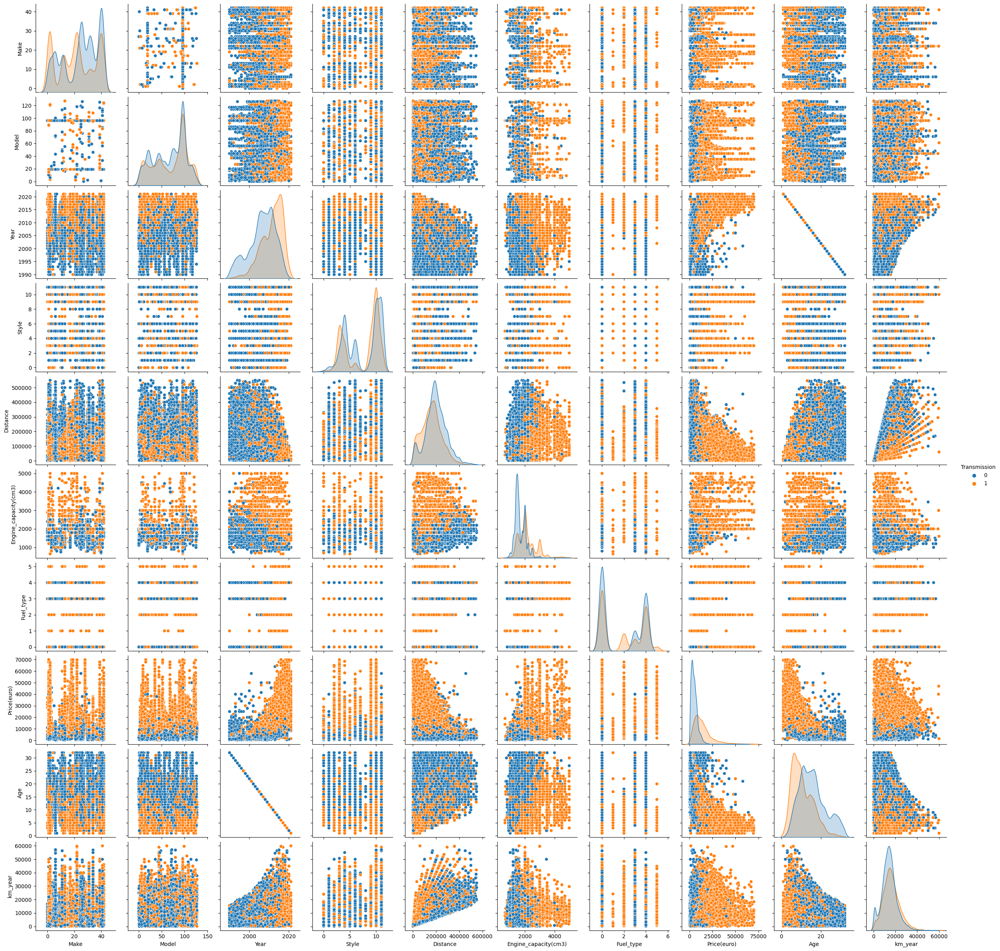

In [562]:
sns.pairplot(data = df_se, hue ='Transmission')

### One-hot кодирование многозначных признаков

In [563]:
df_ohe = df.copy()
df_ohe = pd.get_dummies(df_ohe)
df_ohe.tail()

,Year,Distance,Engine_capacity(cm3),Transmission,Price(euro),Age,km_year,Make_Alfa Romeo,Make_Audi,Make_BMW,...,Style_Universal,Fuel_type_Diesel,Fuel_type_Electric,Fuel_type_Hybrid,Fuel_type_Metan/Propan,Fuel_type_Petrol,Fuel_type_Plug-in Hybrid,km_year_category_low_km_year,km_year_category_mean_km_year,km_year_category_high_km_year
31068,2016,88000.0,1800.0,1,11500.0,6,14666.666667,0,0,0,...,0,0,0,0,0,1,0,0,1,0
31069,2002,225000.0,1800.0,0,4400.0,20,11250.000000,0,0,0,...,0,0,0,0,1,0,0,1,0,0
31070,2015,89000.0,1500.0,0,7000.0,7,12714.285714,0,0,0,...,1,1,0,0,0,0,0,0,1,0
31071,2006,370000.0,2000.0,0,4000.0,16,23125.000000,0,0,0,...,0,1,0,0,0,0,0,0,0,1
31072,2006,300000.0,1500.0,0,4000.0,16,18750.000000,0,0,0,...,0,1,0,0,0,0,0,0,0,1


In [564]:
df_ohe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31073 entries, 0 to 31072
Columns: 199 entries, Year to km_year_category_high_km_year
dtypes: float64(4), int64(3), uint8(192)
memory usage: 7.3 MB


## Сохраняем 

In [566]:
df_se.to_csv('cars_cat_num.csv', index=False)
df_ohe.to_csv('cars_onehot.csv', index=False)
DF_norm.to_csv('cars_norm.csv', index=False)
DF_scaled.to_csv('cars_scaled.csv', index=False)
DF_power.to_csv('cars_power.csv', index=False)